## 2.0 Exploratory Data Analysis

Exploration of Data for knowledge, corrections, further cleaning, tidying and visualisation purpose.


- [2.1 Switching categorial columns to ordinal](#2.1-Switching-categorial-columns-to-ordinal)

- [2.2 Seeking Outliers](#2.2-Seeking-Outliers)

- [2.3 Normality of the Data](#2.3-Normality-of-the-Data)

- [2.4 Ordinal Median Distribution](#2.4-Ordinal-Median-Distribution)

- [2.5 Heatmap, Pairplots & Scatter plots correlations](#2.5-Heatmap,-Pairplots-&-Scatter-plots-correlations)


Or back to [01_Cleaning_for_Train_and_Test_Sets](01_Cleaning_for_Train_and_Test_Sets.ipynb)

***

#### Importing:

In [1]:
# import
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy import stats

plt.style.use('ggplot')
%config InlineBackend.figure_format = 'retina'
%matplotlib inline

In [2]:
# read training data
train = pd.read_csv('../datasets/train_clean.csv', index_col="Unnamed: 0")

In [3]:
# view shape before drop
print(train.shape)

(2051, 81)


In [4]:
# show all rows and columns
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)

***

#### Defined functions:


In [5]:
# create function for printing value counts
def val_count(df, columns):
    """ for value counts"""
    
    print (df[columns].value_counts(dropna=False))

In [6]:
# create fucntion for viewing nulls
def viewnull (df, columns):
    """for viewing 'NaN' entries by column and dataframe"""
    
    return df[df[columns].isnull()]

In [7]:
# create function for viewing unique
def viewuni(df, columns):
    """for viewing unique entries by column and dataframe"""
    
    print(df[columns].unique())

In [8]:
# create function for replacing values
def replace_val(df, columns, old_value, new_value):
    """ for replacing values in columns"""
    
    df[columns] = df[columns].replace({old_value: new_value})

In [9]:
# create mask function
def and_test(df, column_1, value_1, column_2, value_2 ):
    """ returns row where column_1 is value_1 and column_2 is not value 2"""
    
    mask= (df[column_1] == value_1) & (df[column_2] !=value_2)
    return df.loc[mask]

In [10]:
# create a function for replacing specific values
def replace_sval(df, index, columns, value):
    """for replacing specific values by index and column"""
    
    df.at[index, columns] = value
    return print(df[columns][index])


In [11]:
# create function for null and not null pair testing
def null_test(df, column_1,column_2):
    """ returns row where column_1 is null, column_2 is not null"""
    
    mask = (df[column_1].isnull()) & (df[column_2].notnull())
    return df.loc[mask]
    

In [36]:
# boxplot subplots function
def plotbox(df, column_x, column_y, subplot_no, title):
    """for plotting boxplots in subplots"""
    
    # indicate subplot
    ax1 = plt.subplot(subplot_no) 
    
    # set title
    ax1.set_title(title) 
    
    # boxplot
    sns.boxplot(data=df,x=column_x, y=column_y, color= 'salmon'); 
    
    # mean line
    plt.axhline(np.median(df[column_y]), color='black',linestyle='--') 
    
    # indicate lengend, top right
    plt.legend([column_y +" Median"], loc="upper right") 

In [13]:
# distplot subplotsfunction
def plotdist (df, columns, subplot_no, title):
    """for plotting distplot in subplots"""
    
    # indicate subplot
    ax1 = plt.subplot(subplot_no) 
    
    # set title
    ax1.set_title(title) 
    
    # distribution plot, with kde
    sns.distplot(df[columns], kde=True); 


In [14]:
# barplot subplots function
def plotbar(df, column_x, column_y, subplot_no, title):
    """for plotting barplots in subplots"""
    
    # indicate subplot
    ax1 = plt.subplot(subplot_no) 
    
    # set title
    ax1.set_title(title) 
    
    # barplot
    sns.barplot(x=column_x, y=column_y, data=df, color ='tomato', estimator=np.median); 

In [15]:
# function to create heatmaps with mask
def mapheat(df, size):
    """ function to create custom heatmap"""
    
    # establish size of figure
    plt.figure(figsize=(size,size))

    # data
    corr = df.corr()
    # create mask for upper triangle
    mask1 = np.zeros_like(corr)
    mask1[np.triu_indices_from(mask1)] = True

    # plot the heatmap with mask
    with sns.axes_style("white"):
        sns.heatmap(corr, mask=mask1, vmax=1, square=True, annot=True, cmap='vlag', vmin=-1);

In [16]:
# regplot function
def plotreg(df, column_x, column_y, subplot_no, title):
    """for plotting regplots in subplots"""
    
    #indicate subplot
    ax1 = plt.subplot(subplot_no) 
    
    # set title
    ax1.set_title(title) 
    
    # regplot
    sns.regplot(x=column_x, y=column_y, data=df, color='salmon'); 

In [17]:
# function to map change in values in columns by dict:
def val_map(df, columns, dictionary):
    """ to change values in columns by mapping a dictionary"""
    
    df[columns]= df[columns].map(dictionary)
    print (df[columns].value_counts(dropna=False))

In [18]:
#function for corr only showing saleprice corr

def corrsort(df, columns):
    """ for returning corr single column"""
    
    corr_all = df.corr()
    
    # unstacking corr data
    unstacked = corr_all.unstack()
    
    # sorting corr data
    sort = unstacked.sort_values(ascending=False)
    return sort[columns]

***


#### Initial View of Clean Data:

In [19]:
#review data (train)
train.head()

,id,pid,ms_subclass,ms_zoning,lot_frontage,lot_area,street,alley,lot_shape,land_contour,utilities,lot_config,land_slope,neighborhood,condition_1,condition_2,bldg_type,house_style,overall_qual,overall_cond,year_built,year_remod/add,roof_style,roof_matl,exterior_1st,exterior_2nd,mas_vnr_type,mas_vnr_area,exter_qual,exter_cond,foundation,bsmt_qual,bsmt_cond,bsmt_exposure,bsmtfin_type_1,bsmtfin_sf_1,bsmtfin_type_2,bsmtfin_sf_2,bsmt_unf_sf,total_bsmt_sf,heating,heating_qc,central_air,electrical,flr_sf_1st,flr_sf_2nd,low_qual_fin_sf,gr_liv_area,bsmt_full_bath,bsmt_half_bath,full_bath,half_bath,bedroom_abvgr,kitchen_abvgr,kitchen_qual,totrms_abvgrd,functional,fireplaces,fireplace_qu,garage_type,garage_yr_blt,garage_finish,garage_cars,garage_area,garage_qual,garage_cond,paved_drive,wood_deck_sf,open_porch_sf,enclosed_porch,porch_3ssn,screen_porch,pool_area,pool_qc,fence,misc_feature,misc_val,mo_sold,yr_sold,sale_type,saleprice
0,109,533352170,60,RL,NaN,13517,Pave,None,IR1,Lvl,AllPub,CulDSac,Gtl,Sawyer,RRAe,Norm,1Fam,2Story,6,8,1976,2005,Gable,CompShg,HdBoard,Plywood,BrkFace,289.0,Gd,TA,CBlock,TA,TA,No,GLQ,533.0,Unf,0.0,192.0,725.0,GasA,Ex,Y,SBrkr,725,754,0,1479,0.0,0.0,2,1,3,1,Gd,6,Typ,0,None,Attchd,1976.0,RFn,2.0,475.0,TA,TA,Y,0,44,0,0,0,0,None,None,None,0,3,2010,WD,130500
1,544,531379050,60,RL,43.0,11492,Pave,None,IR1,Lvl,AllPub,CulDSac,Gtl,SawyerW,Norm,Norm,1Fam,2Story,7,5,1996,1997,Gable,CompShg,VinylSd,VinylSd,BrkFace,132.0,Gd,TA,PConc,Gd,TA,No,GLQ,637.0,Unf,0.0,276.0,913.0,GasA,Ex,Y,SBrkr,913,1209,0,2122,1.0,0.0,2,1,4,1,Gd,8,Typ,1,TA,Attchd,1997.0,RFn,2.0,559.0,TA,TA,Y,0,74,0,0,0,0,None,None,None,0,4,2009,WD,220000
2,153,535304180,20,RL,68.0,7922,Pave,None,Reg,Lvl,AllPub,Inside,Gtl,NAmes,Norm,Norm,1Fam,1Story,5,7,1953,2007,Gable,CompShg,VinylSd,VinylSd,None,0.0,TA,Gd,CBlock,TA,TA,No,GLQ,731.0,Unf,0.0,326.0,1057.0,GasA,TA,Y,SBrkr,1057,0,0,1057,1.0,0.0,1,0,3,1,Gd,5,Typ,0,None,Detchd,1953.0,Unf,1.0,246.0,TA,TA,Y,0,52,0,0,0,0,None,None,None,0,1,2010,WD,109000
3,318,916386060,60,RL,73.0,9802,Pave,None,Reg,Lvl,AllPub,Inside,Gtl,Timber,Norm,Norm,1Fam,2Story,5,5,2006,2007,Gable,CompShg,VinylSd,VinylSd,None,0.0,TA,TA,PConc,Gd,TA,No,Unf,0.0,Unf,0.0,384.0,384.0,GasA,Gd,Y,SBrkr,744,700,0,1444,0.0,0.0,2,1,3,1,TA,7,Typ,0,None,BuiltIn,2007.0,Fin,2.0,400.0,TA,TA,Y,100,0,0,0,0,0,None,None,None,0,4,2010,WD,174000
4,255,906425045,50,RL,82.0,14235,Pave,None,IR1,Lvl,AllPub,Inside,Gtl,SawyerW,Norm,Norm,1Fam,1.5Fin,6,8,1900,1993,Gable,CompShg,Wd Sdng,Plywood,None,0.0,TA,TA,PConc,Fa,Gd,No,Unf,0.0,Unf,0.0,676.0,676.0,GasA,TA,Y,SBrkr,831,614,0,1445,0.0,0.0,2,0,3,1,TA,6,Typ,0,None,Detchd,1957.0,Unf,2.0,484.0,TA,TA,N,0,59,0,0,0,0,None,None,None,0,3,2010,WD,138500


In [20]:
#review data (train)
train.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2051 entries, 0 to 2050
Data columns (total 81 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   id               2051 non-null   int64  
 1   pid              2051 non-null   int64  
 2   ms_subclass      2051 non-null   int64  
 3   ms_zoning        2051 non-null   object 
 4   lot_frontage     1721 non-null   float64
 5   lot_area         2051 non-null   int64  
 6   street           2051 non-null   object 
 7   alley            2051 non-null   object 
 8   lot_shape        2051 non-null   object 
 9   land_contour     2051 non-null   object 
 10  utilities        2051 non-null   object 
 11  lot_config       2051 non-null   object 
 12  land_slope       2051 non-null   object 
 13  neighborhood     2051 non-null   object 
 14  condition_1      2051 non-null   object 
 15  condition_2      2051 non-null   object 
 16  bldg_type        2051 non-null   object 
 17  house_style   

In [21]:
# count of nulls (train)
train.isnull().sum()

id                   0
pid                  0
ms_subclass          0
ms_zoning            0
lot_frontage       330
lot_area             0
street               0
alley                0
lot_shape            0
land_contour         0
utilities            0
lot_config           0
land_slope           0
neighborhood         0
condition_1          0
condition_2          0
bldg_type            0
house_style          0
overall_qual         0
overall_cond         0
year_built           0
year_remod/add       0
roof_style           0
roof_matl            0
exterior_1st         0
exterior_2nd         0
mas_vnr_type         0
mas_vnr_area         0
exter_qual           0
exter_cond           0
foundation           0
bsmt_qual            0
bsmt_cond            0
bsmt_exposure        0
bsmtfin_type_1       0
bsmtfin_sf_1         0
bsmtfin_type_2       0
bsmtfin_sf_2         0
bsmt_unf_sf          0
total_bsmt_sf        0
heating              0
heating_qc           0
central_air          0
electrical 

In [22]:
#review data (train)
train.describe().T

,count,mean,std,min,25%,50%,75%,max
id,2051.0,1.474034e+03,8.439808e+02,1.0,753.5,1486.0,2198.0,2930.0
pid,2051.0,7.135900e+08,1.886918e+08,526301100.0,528458140.0,535453200.0,907180080.0,924152030.0
ms_subclass,2051.0,5.700878e+01,4.282422e+01,20.0,20.0,50.0,70.0,190.0
lot_frontage,1721.0,6.905520e+01,2.326065e+01,21.0,58.0,68.0,80.0,313.0
lot_area,2051.0,1.006521e+04,6.742489e+03,1300.0,7500.0,9430.0,11513.5,159000.0
overall_qual,2051.0,6.112140e+00,1.426271e+00,1.0,5.0,6.0,7.0,10.0
overall_cond,2051.0,5.562165e+00,1.104497e+00,1.0,5.0,5.0,6.0,9.0
year_built,2051.0,1.971709e+03,3.017789e+01,1872.0,1953.5,1974.0,2001.0,2010.0
year_remod/add,2051.0,1.984190e+03,2.103625e+01,1950.0,1964.5,1993.0,2004.0,2010.0
mas_vnr_area,2051.0,9.831692e+01,1.742180e+02,0.0,0.0,0.0,158.0,1600.0


In [23]:
#review data (train)
train.describe(exclude=np.number).T

,count,unique,top,freq
ms_zoning,2051,7,RL,1598
street,2051,2,Pave,2044
alley,2051,3,None,1911
lot_shape,2051,4,Reg,1295
land_contour,2051,4,Lvl,1843
utilities,2051,3,AllPub,2049
lot_config,2051,5,Inside,1503
land_slope,2051,3,Gtl,1953
neighborhood,2051,28,NAmes,310
condition_1,2051,9,Norm,1767


***


#### 2.1 Switching categorial columns to ordinal

Some categorical data have orders to them, to make it work better for our understanding and analysis, I will transform them into numeric value rating the category. (i.e Good: 1, Better:2, Best:3)

Back to [2.0 Exploratory Data Analysis](#2.0-Exploratory-Data-Analysis)

In [24]:
# dictionary for replacing values in ms_subclass:
di_subclass = {20: "1-STORY 1946 & NEWER ALL STYLES",
               30: "1-STORY 1945 & OLDER",
               40:"1-STORY W/FINISHED ATTIC ALL AGES",
               45:"1-1/2 STORY - UNFINISHED ALL AGES",
               50:"1-1/2 STORY FINISHED ALL AGES",
               60:"2-STORY 1946 & NEWER",
               70:"2-STORY 1945 & OLDER",
               75:"2-1/2 STORY ALL AGES",
               80:"SPLIT OR MULTI-LEVEL",
               85:"SPLIT FOYER",
               90:"DUPLEX - ALL STYLES AND AGES",
               120:"1-STORY PUD (Planned Unit Development) - 1946 & NEWER",
               150:"1-1/2 STORY PUD - ALL AGES",
               160:"2-STORY PUD - 1946 & NEWER",
               180:"PUD - MULTILEVEL - INCL SPLIT LEV/FOYER",
               190:"2 FAMILY CONVERSION - ALL STYLES AND AGES"}

# mapping via function
val_map(train, 'ms_subclass', di_subclass)

1-STORY 1946 & NEWER ALL STYLES                          770
2-STORY 1946 & NEWER                                     394
1-1/2 STORY FINISHED ALL AGES                            198
1-STORY PUD (Planned Unit Development) - 1946 & NEWER    132
1-STORY 1945 & OLDER                                     101
2-STORY 1945 & OLDER                                      90
2-STORY PUD - 1946 & NEWER                                88
SPLIT OR MULTI-LEVEL                                      86
DUPLEX - ALL STYLES AND AGES                              75
2 FAMILY CONVERSION - ALL STYLES AND AGES                 46
SPLIT FOYER                                               28
2-1/2 STORY ALL AGES                                      16
1-1/2 STORY - UNFINISHED ALL AGES                         11
PUD - MULTILEVEL - INCL SPLIT LEV/FOYER                   11
1-STORY W/FINISHED ATTIC ALL AGES                          4
1-1/2 STORY PUD - ALL AGES                                 1
Name: ms_subclass, dtype

In [25]:
#d ictionary for replacing values:
di_quality2 = {"GdPrv":4, "MnPrv":3, "GdWo":2, "MnWw":1, "None": 0 }

# mapping via function
val_map(train, "fence", di_quality2)

0    1651
3     227
4      83
2      80
1      10
Name: fence, dtype: int64


In [26]:
# dictionary for replacing values
di_quality3 = {"Y":3, "P":2,"N":1}

# mapping via function
val_map(train, "paved_drive", di_quality3)

3    1861
1     151
2      39
Name: paved_drive, dtype: int64


In [27]:
#d ictionary for replacing values
di_quality4 = {"Fin":3, "RFn":2, "Unf":1, "None":0 }
    
# mapping via function
val_map(train, "garage_finish", di_quality4)

1    849
2    579
3    509
0    114
Name: garage_finish, dtype: int64


In [28]:
# dictionary for replacing values
di_quality5 = {"Gd":4, "Av":3, "Mn":2, "No":1, "None":0}

# mapping via function
val_map(train, "bsmt_exposure", di_quality5)

1    1342
3     288
4     203
2     163
0      55
Name: bsmt_exposure, dtype: int64


In [29]:
# dictionary for replacing values
di_quality6 = {"Ex":5, "Gd":4, "TA":3, "Fa":2, "Po":1, "None":0}

# list for columns to be changed
col_list = ["exter_qual", "exter_cond","bsmt_qual", "bsmt_cond", "heating_qc", 
            "kitchen_qual", "fireplace_qu", "garage_qual", "garage_cond", "pool_qc"]

# mapping via function
for col in col_list:
    val_map(train, col, di_quality6)
    

3    1247
4     697
5      81
2      26
Name: exter_qual, dtype: int64
3    1778
4     215
2      49
5       7
1       2
Name: exter_cond, dtype: int64
3    887
4    864
5    184
2     60
0     55
1      1
Name: bsmt_qual, dtype: int64
3    1834
4      89
2      65
0      55
1       5
5       3
Name: bsmt_cond, dtype: int64
5    1065
3     597
4     319
2      67
1       3
Name: heating_qc, dtype: int64
3    1047
4     806
5     151
2      47
Name: kitchen_qual, dtype: int64
0    1000
4     523
3     407
2      59
5      31
1      31
Name: fireplace_qu, dtype: int64
3    1832
0     114
2      82
4      18
5       3
1       2
Name: garage_qual, dtype: int64
3    1868
0     114
2      47
4      12
1       8
5       2
Name: garage_cond, dtype: int64
0    2042
4       4
3       2
2       2
5       1
Name: pool_qc, dtype: int64


In [30]:
#d ictionary for replacing values
di_quality7 = {"GLQ":6, "ALQ":5, "BLQ":4, "Rec":3, "LwQ":2, "Unf":1, "None":0 }

# list for columns to be chnaged
col_list =["bsmtfin_type_1","bsmtfin_type_2"]

# mapping via function
for col in col_list:
    val_map(train, col, di_quality7)
    

6    615
1    603
5    293
4    200
3    183
2    102
0     55
Name: bsmtfin_type_1, dtype: int64
1    1749
3      80
2      60
0      56
4      48
5      35
6      23
Name: bsmtfin_type_2, dtype: int64


In [31]:
# dictionary for replacing values
di_quality8 = {"Typ": 8, "Min1":7, "Min2":6, "Mod":5, "Maj1":4, "Maj2":3, "Sev":2, "Sal":1  }

# mapping via function
val_map(train, "functional", di_quality8)

8    1915
7      42
6      42
5      29
4      12
3       7
1       2
2       2
Name: functional, dtype: int64


In [32]:
# dictionary for replacing values
di_quality9 = {"AllPub":4, "NoSewr":3, "NoSeWa":2, "ELO":1}

# mapping via function
val_map(train, "utilities", di_quality9)

4    2049
3       1
2       1
Name: utilities, dtype: int64


In [33]:
train.describe().T

,count,mean,std,min,25%,50%,75%,max
id,2051.0,1.474034e+03,8.439808e+02,1.0,753.5,1486.0,2198.0,2930.0
pid,2051.0,7.135900e+08,1.886918e+08,526301100.0,528458140.0,535453200.0,907180080.0,924152030.0
lot_frontage,1721.0,6.905520e+01,2.326065e+01,21.0,58.0,68.0,80.0,313.0
lot_area,2051.0,1.006521e+04,6.742489e+03,1300.0,7500.0,9430.0,11513.5,159000.0
utilities,2051.0,3.998537e+00,4.936480e-02,2.0,4.0,4.0,4.0,4.0
overall_qual,2051.0,6.112140e+00,1.426271e+00,1.0,5.0,6.0,7.0,10.0
overall_cond,2051.0,5.562165e+00,1.104497e+00,1.0,5.0,5.0,6.0,9.0
year_built,2051.0,1.971709e+03,3.017789e+01,1872.0,1953.5,1974.0,2001.0,2010.0
year_remod/add,2051.0,1.984190e+03,2.103625e+01,1950.0,1964.5,1993.0,2004.0,2010.0
mas_vnr_area,2051.0,9.831692e+01,1.742180e+02,0.0,0.0,0.0,158.0,1600.0


In [34]:
# review data (train)
train.describe(exclude=np.number).T

,count,unique,top,freq
ms_subclass,2051,16,1-STORY 1946 & NEWER ALL STYLES,770
ms_zoning,2051,7,RL,1598
street,2051,2,Pave,2044
alley,2051,3,None,1911
lot_shape,2051,4,Reg,1295
land_contour,2051,4,Lvl,1843
lot_config,2051,5,Inside,1503
land_slope,2051,3,Gtl,1953
neighborhood,2051,28,NAmes,310
condition_1,2051,9,Norm,1767


***

#### 2.2 Seeking Outliers

Outliers are rare and should be investigated before removal of the data. I am plotting graphs to visually and logically inspect the data before action.

Back to [2.0 Exploratory Data Analysis](#2.0-Exploratory-Data-Analysis)

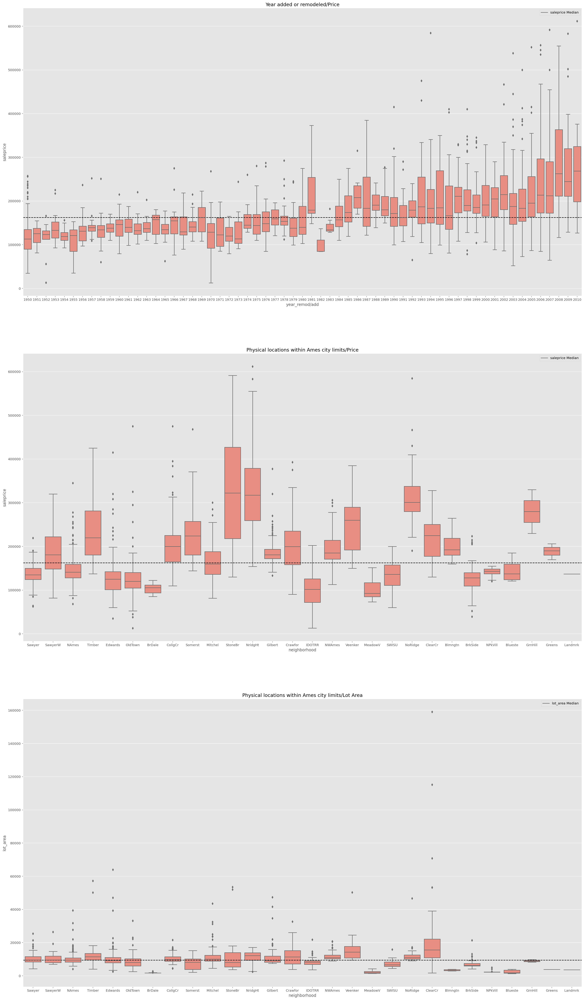

In [38]:
# plotting boxplot subplots for the columns

plt.figure(figsize=(30,130))

plotbox(train, 'year_remod/add','saleprice', 711, "Year added or remodeled/Price")
plotbox(train, 'neighborhood','saleprice', 712, 
        "Physical locations within Ames city limits/Price")
plotbox(train, 'neighborhood','lot_area', 713, 
        "Physical locations within Ames city limits/Lot Area")

<div class="alert alert-block alert-info">
 

    
<b>Year added or remodeled/Price:</b> This plot shows how older houses have lesser value. Houses built aftr 1985 all have medians higher than the category median. 

<b>Physical locations within Ames city limits/Price:</b> This plot shows how some cities have a higher median and hoe some are below the belt. The highest outliest all come from citys with the highest median. 

<b>Physical locations within Ames city limits/Lot Area:</b> This plot shows where the cities lie in area values. ClearCR, Clear Creek has of several of the highest outliers, iindicating this might not be erroneous but might be due to its town's properties as it also has its 25th percentile above the average median.   
 
</div>

***

In [39]:
train['saleprice'].describe()

count      2051.000000
mean     181469.701609
std       79258.659352
min       12789.000000
25%      129825.000000
50%      162500.000000
75%      214000.000000
max      611657.000000
Name: saleprice, dtype: float64

In [40]:
outliers = train['saleprice'].quantile(0.99)
train[train['saleprice'] > outliers].describe()

,id,pid,lot_frontage,lot_area,utilities,overall_qual,overall_cond,year_built,year_remod/add,mas_vnr_area,exter_qual,exter_cond,bsmt_qual,bsmt_cond,bsmt_exposure,bsmtfin_type_1,bsmtfin_sf_1,bsmtfin_type_2,bsmtfin_sf_2,bsmt_unf_sf,total_bsmt_sf,heating_qc,flr_sf_1st,flr_sf_2nd,low_qual_fin_sf,gr_liv_area,bsmt_full_bath,bsmt_half_bath,full_bath,half_bath,bedroom_abvgr,kitchen_abvgr,kitchen_qual,totrms_abvgrd,functional,fireplaces,fireplace_qu,garage_yr_blt,garage_finish,garage_cars,garage_area,garage_qual,garage_cond,paved_drive,wood_deck_sf,open_porch_sf,enclosed_porch,porch_3ssn,screen_porch,pool_area,pool_qc,fence,misc_val,mo_sold,yr_sold,saleprice
count,21.000000,2.100000e+01,20.000000,21.000000,21.0,21.000000,21.000000,21.000000,21.000000,21.000000,21.000000,21.000000,21.000000,21.000000,21.000000,21.000000,21.000000,21.000000,21.000000,21.000000,21.000000,21.0,21.000000,21.000000,21.000000,21.000000,21.000000,21.0,21.000000,21.000000,21.000000,21.0,21.000000,21.000000,21.000000,21.000000,21.000000,21.000000,21.000000,21.000000,21.000000,21.000000,21.0,21.0,21.000000,21.000000,21.000000,21.0,21.000000,21.0,21.0,21.000000,21.0,21.000000,21.000000,21.000000
mean,1292.714286,5.636953e+08,85.800000,18670.761905,4.0,9.380952,5.190476,1999.809524,2005.238095,569.857143,4.761905,3.190476,4.809524,3.047619,3.333333,4.857143,1168.000000,1.428571,92.000000,832.095238,2092.095238,5.0,2073.714286,622.095238,27.238095,2723.047619,0.809524,0.0,2.333333,0.809524,3.095238,1.0,4.952381,9.761905,7.857143,1.428571,4.047619,2004.714286,2.666667,3.047619,912.190476,3.190476,3.0,3.0,175.571429,112.047619,3.333333,0.0,93.380952,0.0,0.0,0.380952,0.0,5.761905,2007.761905,519344.428571
std,961.018842,1.132737e+08,21.542125,11645.167667,0.0,0.589592,0.872872,24.941169,4.380694,300.383969,0.436436,0.511766,0.511766,0.218218,1.110555,2.031889,782.622514,1.362770,320.408021,628.026584,508.888584,0.0,388.027337,704.614995,124.820633,441.479725,0.511766,0.0,0.483046,0.402374,1.091089,0.0,0.218218,1.700140,0.654654,0.507093,0.497613,4.473733,0.577350,0.218218,187.361047,0.511766,0.0,0.0,206.935394,82.175712,15.275252,0.0,131.247277,0.0,0.0,1.203170,0.0,2.385472,1.546116,49461.489393
min,16.000000,5.272100e+08,47.000000,11128.000000,4.0,8.000000,5.000000,1892.000000,1993.000000,0.000000,4.000000,3.000000,3.000000,3.000000,1.000000,1.000000,0.000000,1.000000,0.000000,48.000000,1107.000000,5.0,1414.000000,0.000000,0.000000,2076.000000,0.000000,0.0,2.000000,0.000000,1.000000,1.0,4.000000,7.000000,5.000000,1.000000,3.000000,1993.000000,1.000000,3.000000,670.000000,3.000000,3.0,3.0,0.000000,0.000000,0.000000,0.0,0.000000,0.0,0.0,0.000000,0.0,1.000000,2006.000000,457347.000000
25%,424.000000,5.272161e+08,62.250000,13518.000000,4.0,9.000000,5.000000,2004.000000,2005.000000,424.000000,5.000000,3.000000,5.000000,3.000000,3.000000,5.000000,292.000000,1.000000,0.000000,300.000000,1733.000000,5.0,1734.000000,0.000000,0.000000,2364.000000,1.000000,0.0,2.000000,1.000000,2.000000,1.0,5.000000,8.000000,8.000000,1.000000,4.000000,2004.000000,2.000000,3.000000,795.000000,3.000000,3.0,3.0,0.000000,37.000000,0.000000,0.0,0.000000,0.0,0.0,0.000000,0.0,4.000000,2006.000000,475000.000000
50%,1426.000000,5.281101e+08,90.500000,15431.000000,4.0,9.000000,5.000000,2006.000000,2006.000000,662.000000,5.000000,3.000000,5.000000,3.000000,4.000000,6.000000,1282.000000,1.000000,0.000000,644.000000,2076.000000,5.0,2076.000000,0.000000,0.000000,2696.000000,1.000000,0.0,2.000000,1.000000,3.000000,1.0,5.000000,10.000000,8.000000,1.000000,4.000000,2005.000000,3.000000,3.000000,841.000000,3.000000,3.0,3.0,182.000000,86.000000,0.000000,0.0,0.000000,0.0,0.0,0.000000,0.0,6.000000,2008.000000,501837.000000
75%,2331.000000,5.281760e+08,104.250000,17242.000000,4.0,10.000000,5.000000,2008.000000,2008.000000,738.000000,5.000000,3.000000,5.000000,3.000000,4.000000,6.000000,1767.000000,1.000000,0.000000,1473.000000,2458.000000,5.0,2364.000000,1174.000000,0.000000,2868.000000,1.000000,0.0,3.000000,1.000000,

In [41]:
train[train['saleprice'] > 457_346]

,id,pid,ms_subclass,ms_zoning,lot_frontage,lot_area,street,alley,lot_shape,land_contour,utilities,lot_config,land_slope,neighborhood,condition_1,condition_2,bldg_type,house_style,overall_qual,overall_cond,year_built,year_remod/add,roof_style,roof_matl,exterior_1st,exterior_2nd,mas_vnr_type,mas_vnr_area,exter_qual,exter_cond,foundation,bsmt_qual,bsmt_cond,bsmt_exposure,bsmtfin_type_1,bsmtfin_sf_1,bsmtfin_type_2,bsmtfin_sf_2,bsmt_unf_sf,total_bsmt_sf,heating,heating_qc,central_air,electrical,flr_sf_1st,flr_sf_2nd,low_qual_fin_sf,gr_liv_area,bsmt_full_bath,bsmt_half_bath,full_bath,half_bath,bedroom_abvgr,kitchen_abvgr,kitchen_qual,totrms_abvgrd,functional,fireplaces,fireplace_qu,garage_type,garage_yr_blt,garage_finish,garage_cars,garage_area,garage_qual,garage_cond,paved_drive,wood_deck_sf,open_porch_sf,enclosed_porch,porch_3ssn,screen_porch,pool_area,pool_qc,fence,misc_feature,misc_val,mo_sold,yr_sold,sale_type,saleprice
41,2383,528110050,1-STORY 1946 & NEWER ALL STYLES,RL,107.0,13891,Pave,None,Reg,Lvl,4,Inside,Gtl,NridgHt,Norm,Norm,1Fam,1Story,10,5,2006,2006,Gable,CompShg,VinylSd,VinylSd,None,0.0,5,3,PConc,5,4,4,6,1386.0,1,0.0,690.0,2076.0,GasA,5,Y,SBrkr,2076,0,0,2076,1.0,0.0,2,1,2,1,5,7,8,1,4,Attchd,2006.0,3,3.0,850.0,3,3,3,216,229,0,0,0,0,0,0,None,0,9,2006,New,465000
81,367,527214050,1-STORY 1946 & NEWER ALL STYLES,RL,63.0,17423,Pave,None,IR1,Lvl,4,CulDSac,Gtl,StoneBr,Norm,Norm,1Fam,1Story,9,5,2008,2009,Hip,CompShg,VinylSd,VinylSd,Stone,748.0,5,3,PConc,5,3,1,6,1904.0,1,0.0,312.0,2216.0,GasA,5,Y,SBrkr,2234,0,0,2234,1.0,0.0,2,0,1,1,5,9,8,1,4,Attchd,2009.0,3,3.0,1166.0,3,3,3,0,60,0,0,0,0,0,0,None,0,7,2009,New,501837
138,2331,527210040,2-STORY 1946 & NEWER,RL,60.0,18062,Pave,None,IR1,HLS,4,CulDSac,Gtl,StoneBr,Norm,Norm,1Fam,2Story,10,5,2006,2006,Hip,CompShg,CemntBd,CmentBd,BrkFace,662.0,5,3,PConc,5,3,4,1,0.0,1,0.0,1528.0,1528.0,GasA,5,Y,SBrkr,1528,1862,0,3390,0.0,0.0,3,1,5,1,5,10,8,1,5,BuiltIn,2006.0,3,3.0,758.0,3,3,3,204,34,0,0,0,0,0,0,None,0,9,2006,New,545224
151,2333,527212030,2-STORY 1946 & NEWER,RL,85.0,16056,Pave,None,IR1,Lvl,4,Inside,Gtl,StoneBr,Norm,Norm,1Fam,2Story,9,5,2005,2006,Hip,CompShg,CemntBd,CmentBd,Stone,208.0,4,3,PConc,5,3,3,6,240.0,1,0.0,1752.0,1992.0,GasA,5,Y,SBrkr,1992,876,0,2868,0.0,0.0,3,1,4,1,5,11,8,1,4,BuiltIn,2005.0,3,3.0,716.0,3,3,3,214,108,0,0,0,0,0,0,None,0,7,2006,New,556581
190,2330,527210030,2-STORY 1946 & NEWER,RL,59.0,16023,Pave,None,IR1,HLS,4,CulDSac,Gtl,StoneBr,Norm,Norm,1Fam,2Story,9,5,2005,2006,Hip,CompShg,VinylSd,VinylSd,BrkFace,600.0,4,5,PConc,5,3,4,6,1218.0,1,0.0,180.0,1398.0,GasA,5,Y,SBrkr,1414,1384,0,2798,1.0,0.0,3,1,3,1,5,11,8,1,4,BuiltIn,2005.0,3,3.0,670.0,3,3,3,182,37,0,0,0,0,0,0,None,0,3,2006,New,457347
332,1060,528118090,2-STORY 1946 & NEWER,RL,96.0,12539,Pave,None,Reg,Lvl,4,Inside,Gtl,NridgHt,PosN,Norm,1Fam,2Story,10,5,2005,2006,Hip,CompShg,CemntBd,CmentBd,BrkFace,468.0,5,3,PConc,5,3,4,6,1082.0,1,0.0,538.0,1620.0,GasA,5,Y,SBrkr,1632,1158,0,2790,1.0,0.0,2,1,4,1,5,10,8,1,5,BuiltIn,2005.0,3,4.0,1150.0,3,3,3,30,200,0,0,192,0,0,0,None,0,6,2008,WD,460000
623,457,528176030,1-STORY 1946 & NEWER ALL STYLES,RL,100.0,14836,Pave,None,IR1,HLS,4,Inside,Mod,NridgHt,Norm,Norm,1Fam,1Story,10,5,2004,2005,Hip,CompShg,CemntBd,CmentBd,Stone,730.0,5,3,PConc,5,3,4,6,2146.0,1,0.0,346.0,2492.0,GasA,5,Y,SBrkr,2492,0,0,2492,1.0,0.0,2,1,2,1,5,8,8,1,5,Attchd,2004.0,3,3.0,949.0,3,3,3,226,235,0,0,0,0,0,0,None,0,2,2009,WD,552000
685,514,528441090,1-STORY 1946 & NEWER ALL STYLES,RL,85.0,11128,Pave,None,Reg,Lvl,4,Corner,Gtl,Somerst,PosN,PosN,1Fam,1Story,9,5,2005,2006,Hip,CompShg,VinylSd,VinylSd,Stone,198.0,5,3,PConc,5,3,4,6,2158.0,1,0.0,300.0,2458.0,GasA,5,Y,SBrkr,2490,0,0,2490,1.0,0.0,2,0,2,1,5,9,8,2,4,Attchd,2005.0,3,3.0,795.0,3,3,3,70,226,0,0,0,0,0,4,None,0,10,2009,WD,468000
800,1702,528118050,1-STORY 1946 & NEWER ALL STYLES,RL,59.0,17169,Pave,None,IR2,Lvl,4,CulDSac,Gtl,NridgHt,Norm,Norm,1Fam,1Story,10,5,2007,2007,Hip,CompShg,CemntBd,CmentBd,BrkFace,970.0,5,3,PConc,5,3,3,6,1684.0,1,0.0,636.0,2320.0,GasA,5,Y,SBrkr

<div class="alert alert-block alert-info">
<b>Outliers (saleprice):</b> As of higher priced properties, I will expect high values for quality columns or large values for quantity columns. The lot here have a min of 8/10 and a mean of 9.3/10 for overall quality of the property although they start at average for conditions of the property. The same goes for the score for the quality of exteriors, basement, heating, kitchen quality. They show above mean values in most area spaces. 
    
<b>Index 1671:</b> The top of the list is a newly contructed home with above average features, coming from a neighbourhood Northridge Heights with above average prices. 
    
<b>Index 1692:</b> is the only house in the list that is built in 1990's. it is from a neighbouhood with above mean salesprice as well and contains above mean quality and area space. 
    
>Outside resources has also shown the range of housing prices from 50,000 to 1,000,000 in Ames. These values make sense and will not be removed. 
</div>

In [42]:
train[train['neighborhood'] == 'ClearCr']

,id,pid,ms_subclass,ms_zoning,lot_frontage,lot_area,street,alley,lot_shape,land_contour,utilities,lot_config,land_slope,neighborhood,condition_1,condition_2,bldg_type,house_style,overall_qual,overall_cond,year_built,year_remod/add,roof_style,roof_matl,exterior_1st,exterior_2nd,mas_vnr_type,mas_vnr_area,exter_qual,exter_cond,foundation,bsmt_qual,bsmt_cond,bsmt_exposure,bsmtfin_type_1,bsmtfin_sf_1,bsmtfin_type_2,bsmtfin_sf_2,bsmt_unf_sf,total_bsmt_sf,heating,heating_qc,central_air,electrical,flr_sf_1st,flr_sf_2nd,low_qual_fin_sf,gr_liv_area,bsmt_full_bath,bsmt_half_bath,full_bath,half_bath,bedroom_abvgr,kitchen_abvgr,kitchen_qual,totrms_abvgrd,functional,fireplaces,fireplace_qu,garage_type,garage_yr_blt,garage_finish,garage_cars,garage_area,garage_qual,garage_cond,paved_drive,wood_deck_sf,open_porch_sf,enclosed_porch,porch_3ssn,screen_porch,pool_area,pool_qc,fence,misc_feature,misc_val,mo_sold,yr_sold,sale_type,saleprice
62,230,905109170,1-STORY 1946 & NEWER ALL STYLES,RL,NaN,20062,Pave,None,IR1,Low,4,Inside,Mod,ClearCr,Norm,Norm,1Fam,1Story,7,7,1977,2001,Hip,CompShg,Wd Sdng,Wd Sdng,None,0.0,4,4,CBlock,4,3,4,5,1092.0,1,0.0,328.0,1420.0,GasA,4,Y,SBrkr,1483,0,0,1483,1.0,0.0,1,1,1,1,3,4,8,2,3,Attchd,1977.0,2,2.0,690.0,3,3,3,496,0,0,0,0,0,0,0,None,0,4,2010,WD,270000
118,1396,905226110,2 FAMILY CONVERSION - ALL STYLES AND AGES,RL,NaN,10532,Pave,None,Reg,Lvl,4,Corner,Gtl,ClearCr,Norm,Norm,1Fam,1Story,5,3,1960,1960,Flat,Tar&Grv,Plywood,Plywood,Stone,275.0,3,3,CBlock,3,3,2,3,988.0,1,0.0,0.0,988.0,GasA,4,Y,SBrkr,1721,0,0,1721,1.0,0.0,2,0,3,1,3,7,5,2,3,Basment,1960.0,1,2.0,626.0,3,3,3,50,84,0,0,0,0,0,0,None,0,12,2008,WD,145000
191,2119,906475170,1-STORY 1946 & NEWER ALL STYLES,RL,155.0,20064,Pave,None,IR1,Low,4,Inside,Sev,ClearCr,Norm,Norm,1Fam,1Story,8,6,1976,1976,Shed,WdShngl,Wd Sdng,Wd Sdng,None,0.0,4,3,CBlock,4,4,4,2,51.0,6,915.0,0.0,966.0,GasA,5,Y,SBrkr,1743,0,0,1743,2.0,0.0,0,1,0,1,4,5,8,2,2,Attchd,1976.0,3,2.0,529.0,3,3,3,646,0,0,0,0,0,0,0,None,0,5,2007,WD,279000
223,1393,905202230,1-STORY 1946 & NEWER ALL STYLES,RL,NaN,13500,Pave,None,Reg,Lvl,4,Inside,Gtl,ClearCr,Norm,Norm,1Fam,1Story,6,7,1960,1975,Flat,CompShg,BrkFace,Plywood,None,0.0,3,3,CBlock,4,3,4,4,429.0,5,1080.0,93.0,1602.0,GasA,4,Y,SBrkr,1252,0,0,1252,1.0,0.0,1,0,1,1,3,4,8,1,4,Attchd,1960.0,2,2.0,564.0,3,3,3,409,0,0,0,0,0,0,0,None,0,3,2008,WD,235000
285,2073,905352010,1-STORY 1946 & NEWER ALL STYLES,RL,NaN,11075,Pave,None,Reg,Lvl,4,Corner,Gtl,ClearCr,Norm,Norm,1Fam,1Story,6,5,1984,1984,Hip,CompShg,Wd Sdng,Wd Sdng,BrkFace,136.0,3,3,PConc,4,3,1,4,299.0,2,891.0,0.0,1190.0,GasA,5,Y,SBrkr,1522,0,0,1522,0.0,0.0,2,0,3,1,3,7,8,1,3,Attchd,1984.0,3,2.0,552.0,3,3,3,0,77,0,0,168,0,0,4,None,0,2,2007,WD,182000
295,1399,905351089,1-STORY PUD (Planned Unit Development) - 1946 ...,RL,NaN,2887,Pave,None,Reg,HLS,4,Inside,Gtl,ClearCr,Norm,Norm,1Fam,1Story,6,5,1996,1997,Gable,CompShg,Wd Sdng,Wd Sdng,None,0.0,3,3,PConc,4,3,2,6,1003.0,1,0.0,288.0,1291.0,GasA,5,Y,SBrkr,1291,0,0,1291,1.0,0.0,1,0,2,1,4,6,8,1,4,Attchd,1996.0,1,2.0,431.0,3,3,3,307,0,0,0,0,0,0,0,None,0,11,2008,WD,173000
471,2116,906426060,1-1/2 STORY FINISHED ALL AGES,RL,NaN,159000,Pave,None,IR2,Low,4,CulDSac,Sev,ClearCr,Norm,Norm,1Fam,1.5Fin,6,7,1958,2006,Gable,CompShg,Wd Sdng,HdBoard,BrkCmn,472.0,4,3,CBlock,4,3,4,3,697.0,1,0.0,747.0,1444.0,GasA,4,Y,SBrkr,1444,700,0,2144,0.0,1.0,2,0,4,1,4,7,8,2,3,Attchd,1958.0,3,2.0,389.0,3,3,3,0,98,0,0,0,0,0,0,Shed,500,6,2007,WD,277000
482,2118,906475110,2-STORY 1946 & NEWER,RL,NaN,12205,Pave,None,IR1,Low,4,Inside,Gtl,ClearCr,Norm,Norm,1Fam,2Story,6,8,1966,2007,Gable,CompShg,HdBoard,HdBoard,BrkFace,157.0,3,3,CBlock,3,2,4,2,568.0,1,0.0,264.0,832.0,GasA,4,Y,SBrkr,976,1111,0,2087,0.0,0.0,2,1,5,1,4,9,8,0,0,Attchd,1966.0,3,2.0,444.0,3,3,3,133,168,0,0,0,0,0,0,None,0,7,2007,WD,187500
560,782,905229040,1-1/2 STORY FINISHED ALL AGES,RL,NaN,11250,Pave,None,Reg,Lvl,4,Inside,Gtl,ClearCr,Norm,Norm,1Fam,1.5Fin,4,5,1957,1989,Gable,CompShg,Wd Sdng,Wd Sdng,None,0.0,3,3,CBlock,3,3,3,1,0.0,1,0.0,1104.0,1104.0,GasA,5,Y

In [43]:
train[train['lot_area'] > 60_000]

,id,pid,ms_subclass,ms_zoning,lot_frontage,lot_area,street,alley,lot_shape,land_contour,utilities,lot_config,land_slope,neighborhood,condition_1,condition_2,bldg_type,house_style,overall_qual,overall_cond,year_built,year_remod/add,roof_style,roof_matl,exterior_1st,exterior_2nd,mas_vnr_type,mas_vnr_area,exter_qual,exter_cond,foundation,bsmt_qual,bsmt_cond,bsmt_exposure,bsmtfin_type_1,bsmtfin_sf_1,bsmtfin_type_2,bsmtfin_sf_2,bsmt_unf_sf,total_bsmt_sf,heating,heating_qc,central_air,electrical,flr_sf_1st,flr_sf_2nd,low_qual_fin_sf,gr_liv_area,bsmt_full_bath,bsmt_half_bath,full_bath,half_bath,bedroom_abvgr,kitchen_abvgr,kitchen_qual,totrms_abvgrd,functional,fireplaces,fireplace_qu,garage_type,garage_yr_blt,garage_finish,garage_cars,garage_area,garage_qual,garage_cond,paved_drive,wood_deck_sf,open_porch_sf,enclosed_porch,porch_3ssn,screen_porch,pool_area,pool_qc,fence,misc_feature,misc_val,mo_sold,yr_sold,sale_type,saleprice
471,2116,906426060,1-1/2 STORY FINISHED ALL AGES,RL,NaN,159000,Pave,None,IR2,Low,4,CulDSac,Sev,ClearCr,Norm,Norm,1Fam,1.5Fin,6,7,1958,2006,Gable,CompShg,Wd Sdng,HdBoard,BrkCmn,472.0,4,3,CBlock,4,3,4,3,697.0,1,0.0,747.0,1444.0,GasA,4,Y,SBrkr,1444,700,0,2144,0.0,1.0,2,0,4,1,4,7,8,2,3,Attchd,1958.0,3,2.0,389.0,3,3,3,0,98,0,0,0,0,0,0,Shed,500,6,2007,WD,277000
694,2072,905301050,1-STORY 1946 & NEWER ALL STYLES,RL,NaN,115149,Pave,None,IR2,Low,4,CulDSac,Sev,ClearCr,Norm,Norm,1Fam,1Story,7,5,1971,2002,Gable,CompShg,Plywood,Plywood,Stone,351.0,3,3,CBlock,4,3,4,6,1219.0,1,0.0,424.0,1643.0,GasA,3,Y,SBrkr,1824,0,0,1824,1.0,0.0,2,0,2,1,4,5,8,2,3,Attchd,1971.0,1,2.0,739.0,3,3,3,380,48,0,0,0,0,0,0,None,0,6,2007,WD,302000
960,1499,908154235,2-STORY 1946 & NEWER,RL,313.0,63887,Pave,None,IR3,Bnk,4,Corner,Gtl,Edwards,Feedr,Norm,1Fam,2Story,10,5,2008,2008,Hip,ClyTile,Stucco,Stucco,Stone,796.0,5,3,PConc,5,3,4,6,5644.0,1,0.0,466.0,6110.0,GasA,5,Y,SBrkr,4692,950,0,5642,2.0,0.0,2,1,3,1,5,12,8,3,4,Attchd,2008.0,3,2.0,1418.0,3,3,3,214,292,0,0,0,480,4,0,None,0,1,2008,New,160000
1854,2767,906475200,1-STORY 1946 & NEWER ALL STYLES,RL,62.0,70761,Pave,None,IR1,Low,4,Inside,Mod,ClearCr,Norm,Norm,1Fam,1Story,7,5,1975,1975,Gable,WdShngl,Plywood,Plywood,None,0.0,3,3,CBlock,4,3,4,5,655.0,1,0.0,878.0,1533.0,GasA,3,Y,SBrkr,1533,0,0,1533,1.0,0.0,2,0,2,1,4,5,8,2,3,Attchd,1975.0,1,2.0,576.0,3,3,3,200,54,0,0,0,0,0,0,None,0,12,2006,WD,280000


<div class="alert alert-block alert-info">
<b>Outliers (lot area):</b> I see most outliers come from the same neighbourhood Clear Creek which is situated near a river bank which might account for the unsually larger lots. The values will remain valid.
</div>

In [44]:
train[train['flr_sf_1st'] > 4000]

,id,pid,ms_subclass,ms_zoning,lot_frontage,lot_area,street,alley,lot_shape,land_contour,utilities,lot_config,land_slope,neighborhood,condition_1,condition_2,bldg_type,house_style,overall_qual,overall_cond,year_built,year_remod/add,roof_style,roof_matl,exterior_1st,exterior_2nd,mas_vnr_type,mas_vnr_area,exter_qual,exter_cond,foundation,bsmt_qual,bsmt_cond,bsmt_exposure,bsmtfin_type_1,bsmtfin_sf_1,bsmtfin_type_2,bsmtfin_sf_2,bsmt_unf_sf,total_bsmt_sf,heating,heating_qc,central_air,electrical,flr_sf_1st,flr_sf_2nd,low_qual_fin_sf,gr_liv_area,bsmt_full_bath,bsmt_half_bath,full_bath,half_bath,bedroom_abvgr,kitchen_abvgr,kitchen_qual,totrms_abvgrd,functional,fireplaces,fireplace_qu,garage_type,garage_yr_blt,garage_finish,garage_cars,garage_area,garage_qual,garage_cond,paved_drive,wood_deck_sf,open_porch_sf,enclosed_porch,porch_3ssn,screen_porch,pool_area,pool_qc,fence,misc_feature,misc_val,mo_sold,yr_sold,sale_type,saleprice
960,1499,908154235,2-STORY 1946 & NEWER,RL,313.0,63887,Pave,None,IR3,Bnk,4,Corner,Gtl,Edwards,Feedr,Norm,1Fam,2Story,10,5,2008,2008,Hip,ClyTile,Stucco,Stucco,Stone,796.0,5,3,PConc,5,3,4,6,5644.0,1,0.0,466.0,6110.0,GasA,5,Y,SBrkr,4692,950,0,5642,2.0,0.0,2,1,3,1,5,12,8,3,4,Attchd,2008.0,3,2.0,1418.0,3,3,3,214,292,0,0,0,480,4,0,None,0,1,2008,New,160000
1885,2181,908154195,1-STORY 1946 & NEWER ALL STYLES,RL,128.0,39290,Pave,None,IR1,Bnk,4,Inside,Gtl,Edwards,Norm,Norm,1Fam,1Story,10,5,2008,2009,Hip,CompShg,CemntBd,CmentBd,Stone,1224.0,5,3,PConc,5,3,4,6,4010.0,1,0.0,1085.0,5095.0,GasA,5,Y,SBrkr,5095,0,0,5095,1.0,1.0,2,1,2,1,5,15,8,2,4,Attchd,2008.0,3,3.0,1154.0,3,3,3,546,484,0,0,0,0,0,0,Elev,17000,10,2007,New,183850


In [45]:
train[train['gr_liv_area'] > 5000]

,id,pid,ms_subclass,ms_zoning,lot_frontage,lot_area,street,alley,lot_shape,land_contour,utilities,lot_config,land_slope,neighborhood,condition_1,condition_2,bldg_type,house_style,overall_qual,overall_cond,year_built,year_remod/add,roof_style,roof_matl,exterior_1st,exterior_2nd,mas_vnr_type,mas_vnr_area,exter_qual,exter_cond,foundation,bsmt_qual,bsmt_cond,bsmt_exposure,bsmtfin_type_1,bsmtfin_sf_1,bsmtfin_type_2,bsmtfin_sf_2,bsmt_unf_sf,total_bsmt_sf,heating,heating_qc,central_air,electrical,flr_sf_1st,flr_sf_2nd,low_qual_fin_sf,gr_liv_area,bsmt_full_bath,bsmt_half_bath,full_bath,half_bath,bedroom_abvgr,kitchen_abvgr,kitchen_qual,totrms_abvgrd,functional,fireplaces,fireplace_qu,garage_type,garage_yr_blt,garage_finish,garage_cars,garage_area,garage_qual,garage_cond,paved_drive,wood_deck_sf,open_porch_sf,enclosed_porch,porch_3ssn,screen_porch,pool_area,pool_qc,fence,misc_feature,misc_val,mo_sold,yr_sold,sale_type,saleprice
960,1499,908154235,2-STORY 1946 & NEWER,RL,313.0,63887,Pave,None,IR3,Bnk,4,Corner,Gtl,Edwards,Feedr,Norm,1Fam,2Story,10,5,2008,2008,Hip,ClyTile,Stucco,Stucco,Stone,796.0,5,3,PConc,5,3,4,6,5644.0,1,0.0,466.0,6110.0,GasA,5,Y,SBrkr,4692,950,0,5642,2.0,0.0,2,1,3,1,5,12,8,3,4,Attchd,2008.0,3,2.0,1418.0,3,3,3,214,292,0,0,0,480,4,0,None,0,1,2008,New,160000
1885,2181,908154195,1-STORY 1946 & NEWER ALL STYLES,RL,128.0,39290,Pave,None,IR1,Bnk,4,Inside,Gtl,Edwards,Norm,Norm,1Fam,1Story,10,5,2008,2009,Hip,CompShg,CemntBd,CmentBd,Stone,1224.0,5,3,PConc,5,3,4,6,4010.0,1,0.0,1085.0,5095.0,GasA,5,Y,SBrkr,5095,0,0,5095,1.0,1.0,2,1,2,1,5,15,8,2,4,Attchd,2008.0,3,3.0,1154.0,3,3,3,546,484,0,0,0,0,0,0,Elev,17000,10,2007,New,183850


<div class="alert alert-block alert-info">
<b>Outliers (1st floor area, general living area):</b> The same two properties have appeared in both 1st floor area and general living space. Given that they also have avbove mean lot areas, it is likely that these houses are not erroneous. They will not be removed as well.
</div>

<div class="alert alert-block alert-info">
<b>Outliers (all):</b> I have not removed any outliers as the my understanding of outliers is that they are rare, as such they should not have a statistical impact accompanied by the extreme multiple values we are seeing, it is unlikely they are the outliers we seek. I will not remove them for now. but if they seem to affect the results down the road, they will be re-evaluated. 
</div>

***


#### 2.3 Normality of the Data

Next, we look at the normality of the data. 

Back to [2.0 Exploratory Data Analysis](#2.0-Exploratory-Data-Analysis)

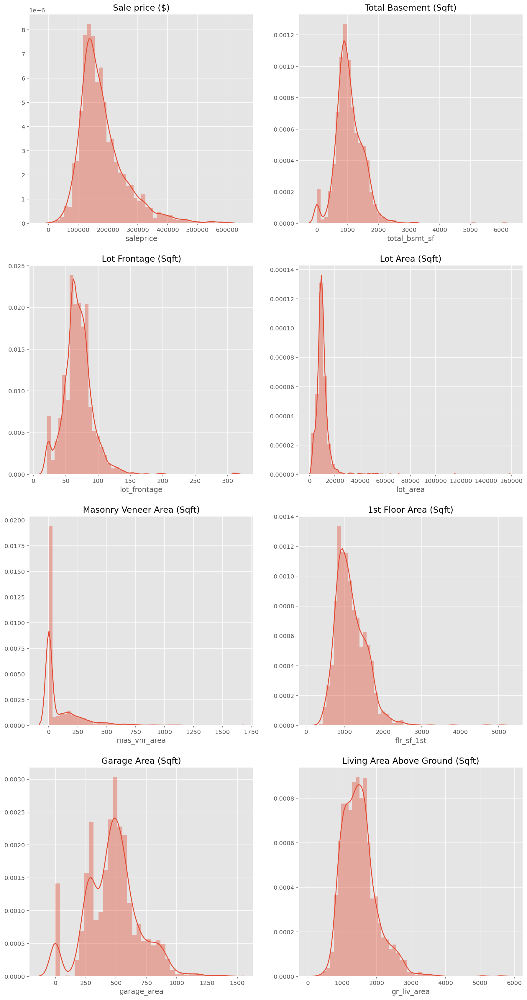

In [46]:
# set figure size
fig = plt.figure(figsize=(15,30)) 

# plotting distplot
plotdist(train, "saleprice", 421, "Sale price ($)")
plotdist(train, "total_bsmt_sf", 422, "Total Basement (Sqft)")
plotdist(train, 'lot_frontage', 423, "Lot Frontage (Sqft)")
plotdist(train, 'lot_area', 424, "Lot Area (Sqft)")
plotdist(train, 'mas_vnr_area', 425, "Masonry Veneer Area (Sqft)")
plotdist(train, 'flr_sf_1st', 426, "1st Floor Area (Sqft)")
plotdist(train, 'garage_area', 427, "Garage Area (Sqft)")
plotdist(train, 'gr_liv_area', 428, "Living Area Above Ground (Sqft)")


<div class="alert alert-block alert-info">
<b>Normality :</b> most of the data are not normal and follow a fairly skewed distribution. Some of them have twin peaks with one at '0' indicating that they are likely yo be additional features to the house.
</div>

***

#### 2.4 Ordinal Median Distribution

Next, we see our new ordinal columns and their relationships to saleprice.
We see the trend of "Quality" columns having a high correlation to the Sale price. As Quality increases, so do the price.

We don't see quite the same strength in "Condition" columns

Back to [2.0 Exploratory Data Analysis](#2.0-Exploratory-Data-Analysis)

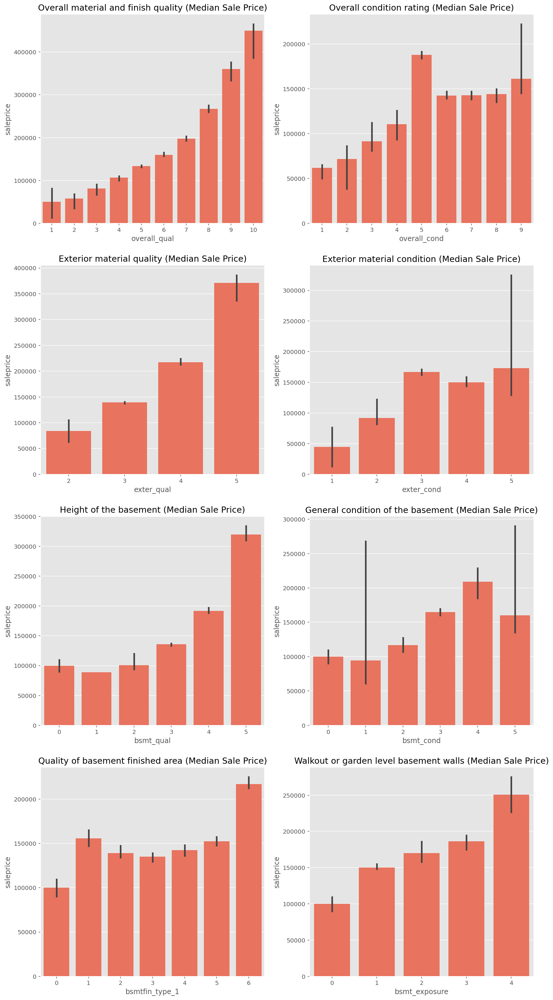

In [47]:
# set figure size
plt.figure(figsize=(15,30))

# plot barplots
plotbar(train, 'overall_qual', 'saleprice', 421, 
        "Overall material and finish quality (Median Sale Price)")
plotbar(train, 'overall_cond', 'saleprice', 422, 
        "Overall condition rating (Median Sale Price)")
plotbar(train, 'exter_qual', 'saleprice', 423, 
        "Exterior material quality (Median Sale Price)")
plotbar(train, 'exter_cond', 'saleprice', 424, 
        "Exterior material condition (Median Sale Price)")
plotbar(train, 'bsmt_qual', 'saleprice', 425, 
        "Height of the basement (Median Sale Price)")
plotbar(train, 'bsmt_cond', 'saleprice', 426, 
        "General condition of the basement (Median Sale Price)")
plotbar(train, 'bsmtfin_type_1', 'saleprice', 427, 
        "Quality of basement finished area (Median Sale Price)")
plotbar(train, 'bsmt_exposure', 'saleprice', 428, 
        "Walkout or garden level basement walls (Median Sale Price)");

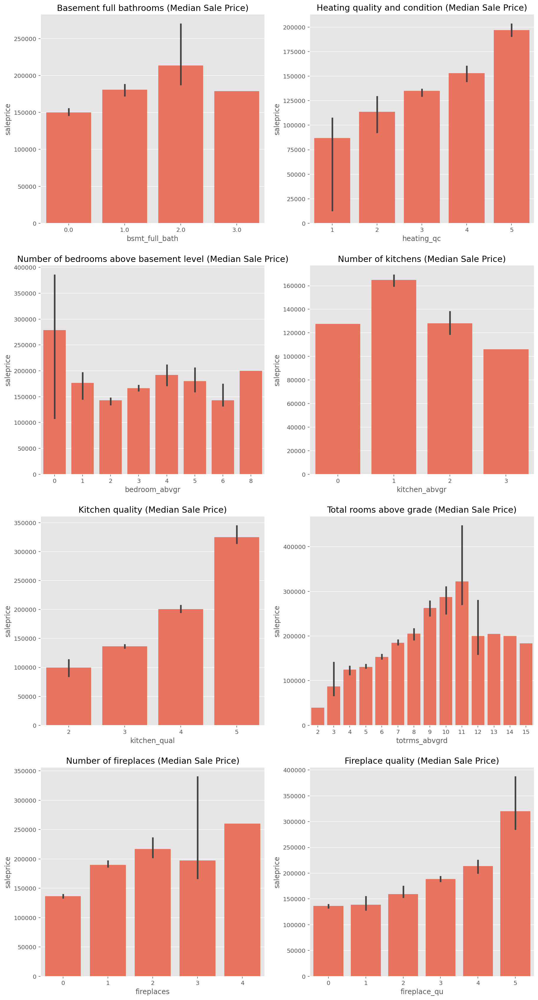

In [48]:
# set figure size
plt.figure(figsize=(15,30))
# plot barplots
plotbar(train, 'bsmt_full_bath', 'saleprice', 421, 
        "Basement full bathrooms (Median Sale Price)")
plotbar(train, 'heating_qc', 'saleprice', 422, 
        "Heating quality and condition (Median Sale Price)")
plotbar(train, 'bedroom_abvgr', 'saleprice', 423, 
        "Number of bedrooms above basement level (Median Sale Price)")
plotbar(train, 'kitchen_abvgr', 'saleprice', 424, 
        "Number of kitchens (Median Sale Price)")
plotbar(train, 'kitchen_qual', 'saleprice', 425, 
        "Kitchen quality (Median Sale Price)")
plotbar(train, 'totrms_abvgrd', 'saleprice', 426, 
        "Total rooms above grade (Median Sale Price)")
plotbar(train, 'fireplaces', 'saleprice', 427, 
        "Number of fireplaces (Median Sale Price)")
plotbar(train, 'fireplace_qu', 'saleprice', 428, 
        "Fireplace quality (Median Sale Price)");

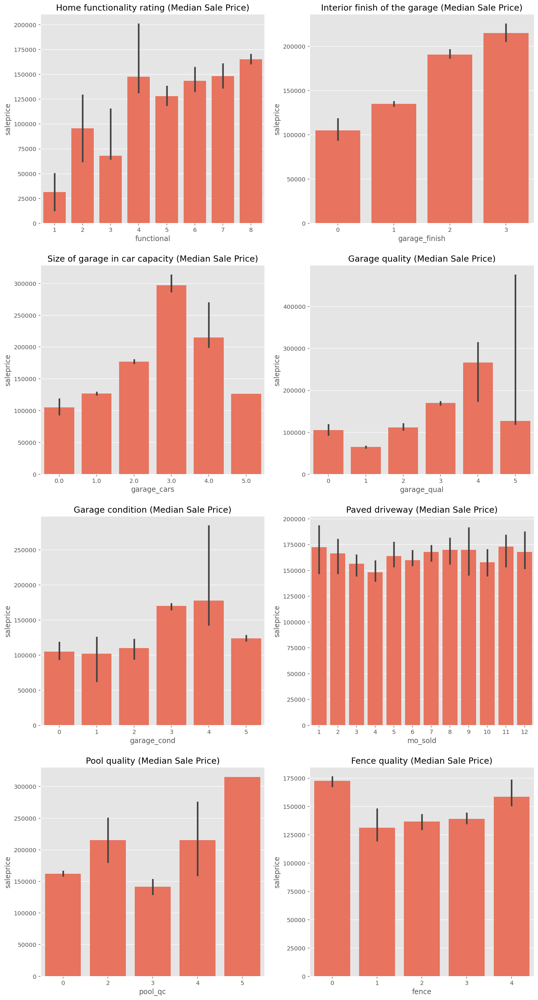

In [49]:
# set figure size
plt.figure(figsize=(15,30))
# plot barplots
plotbar(train, 'functional', 'saleprice', 421, 
        "Home functionality rating (Median Sale Price)")
plotbar(train, 'garage_finish', 'saleprice', 422, 
        "Interior finish of the garage (Median Sale Price)")
plotbar(train, 'garage_cars', 'saleprice', 423, 
        "Size of garage in car capacity (Median Sale Price)")
plotbar(train, 'garage_qual', 'saleprice', 424, 
        "Garage quality (Median Sale Price)")
plotbar(train, 'garage_cond', 'saleprice', 425, 
        "Garage condition (Median Sale Price)")
plotbar(train, 'mo_sold', 'saleprice', 426, 
        "Paved driveway (Median Sale Price)")
plotbar(train, 'pool_qc', 'saleprice', 427, 
        "Pool quality (Median Sale Price)")
plotbar(train, 'fence', 'saleprice', 428, 
        "Fence quality (Median Sale Price)");

***

#### 2.5 Heatmap, Pairplots & Scatter plots correlations

Using the Heatmap and pairplots who find correlated features to zoom in on using the scatter plot functions.

Back to [2.0 Exploratory Data Analysis](#2.0-Exploratory-Data-Analysis)

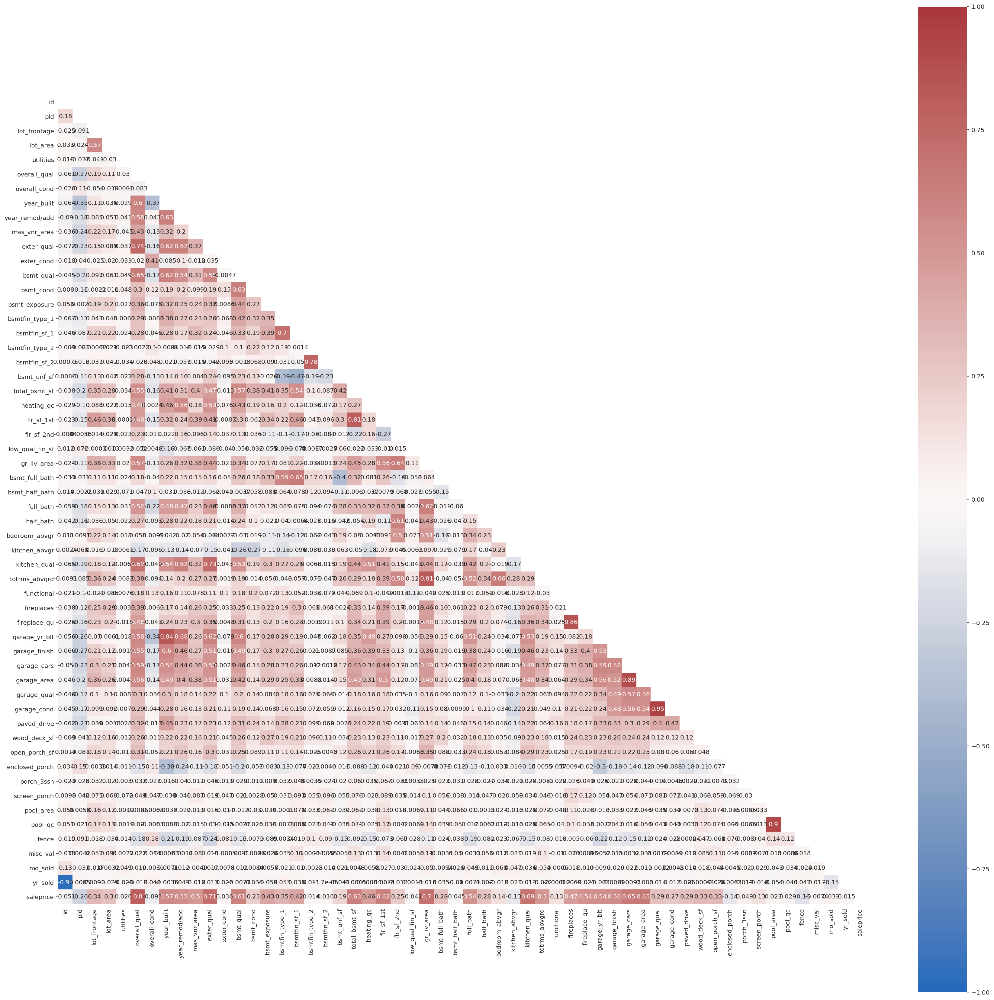

In [50]:
mapheat(train, 30)

<div class="alert alert-block alert-info">
<b>Heatmap:</b> we see a fairly large number of high positive correlations
</div>

In [51]:
# narrowed sales price correlation 
corrsort(train,'saleprice')

saleprice          1.000000
overall_qual       0.800207
exter_qual         0.712146
gr_liv_area        0.697038
kitchen_qual       0.692336
garage_area        0.649897
garage_cars        0.647781
total_bsmt_sf      0.629303
flr_sf_1st         0.618486
bsmt_qual          0.612188
year_built         0.571849
garage_finish      0.557839
year_remod/add     0.550370
garage_yr_blt      0.540931
fireplace_qu       0.538925
full_bath          0.537969
totrms_abvgrd      0.504014
mas_vnr_area       0.503529
fireplaces         0.471093
heating_qc         0.458354
bsmt_exposure      0.425934
bsmtfin_sf_1       0.423856
bsmtfin_type_1     0.350362
lot_frontage       0.341842
open_porch_sf      0.333476
wood_deck_sf       0.326490
lot_area           0.296566
paved_drive        0.290472
garage_qual        0.285281
bsmt_full_bath     0.283332
half_bath          0.283001
garage_cond        0.265021
flr_sf_2nd         0.248452
bsmt_cond          0.225075
bsmt_unf_sf        0.190861
bedroom_abvgr      0

<div class="alert alert-block alert-info">

<b>Heatmap & Correlation list:</b> we now have the intial numerical correlation value for our columns. 
    
It shows that quality and area make up for most of the top features which are positively correlated. 
    
<b>Pairplots:</b> I have split them up for easier viewing.
</div>

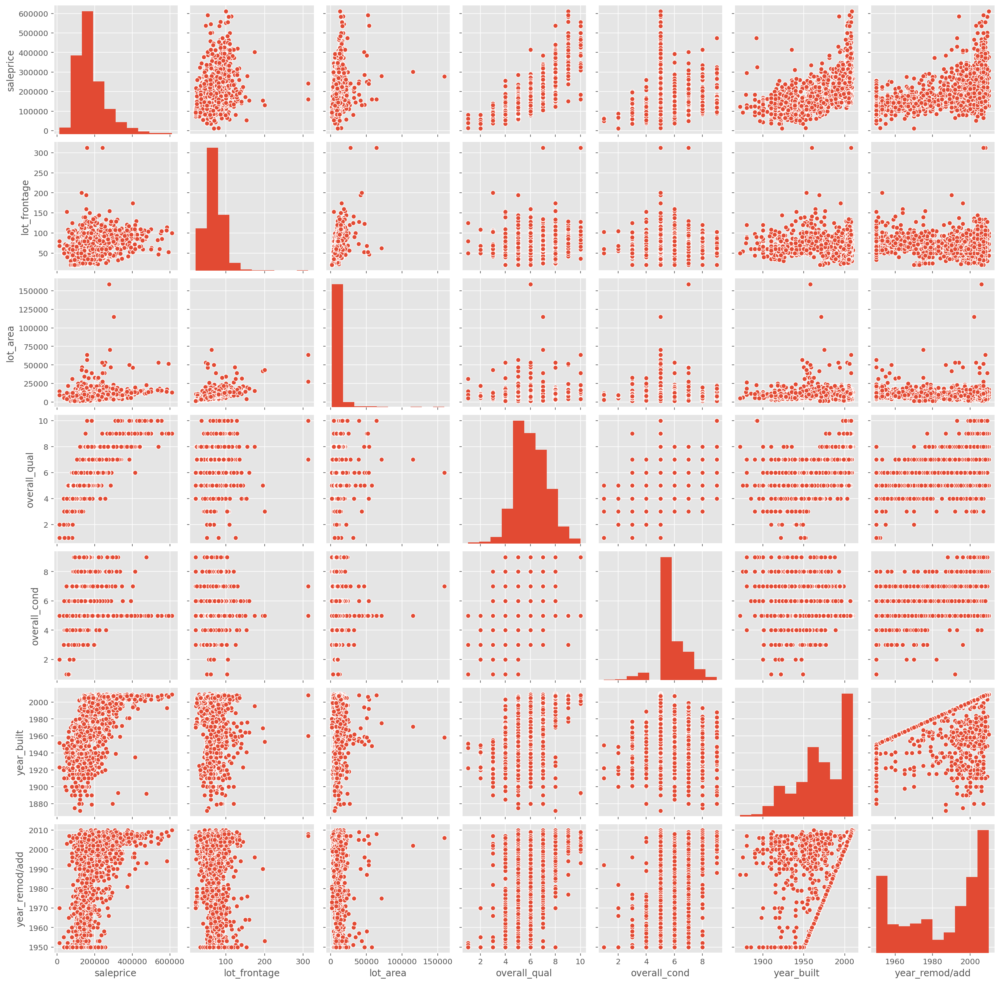

In [52]:
sns.pairplot(train[['saleprice', 'ms_subclass', 'lot_frontage', 'lot_area','overall_qual',
                    'overall_cond', 'year_built', 'year_remod/add']]);

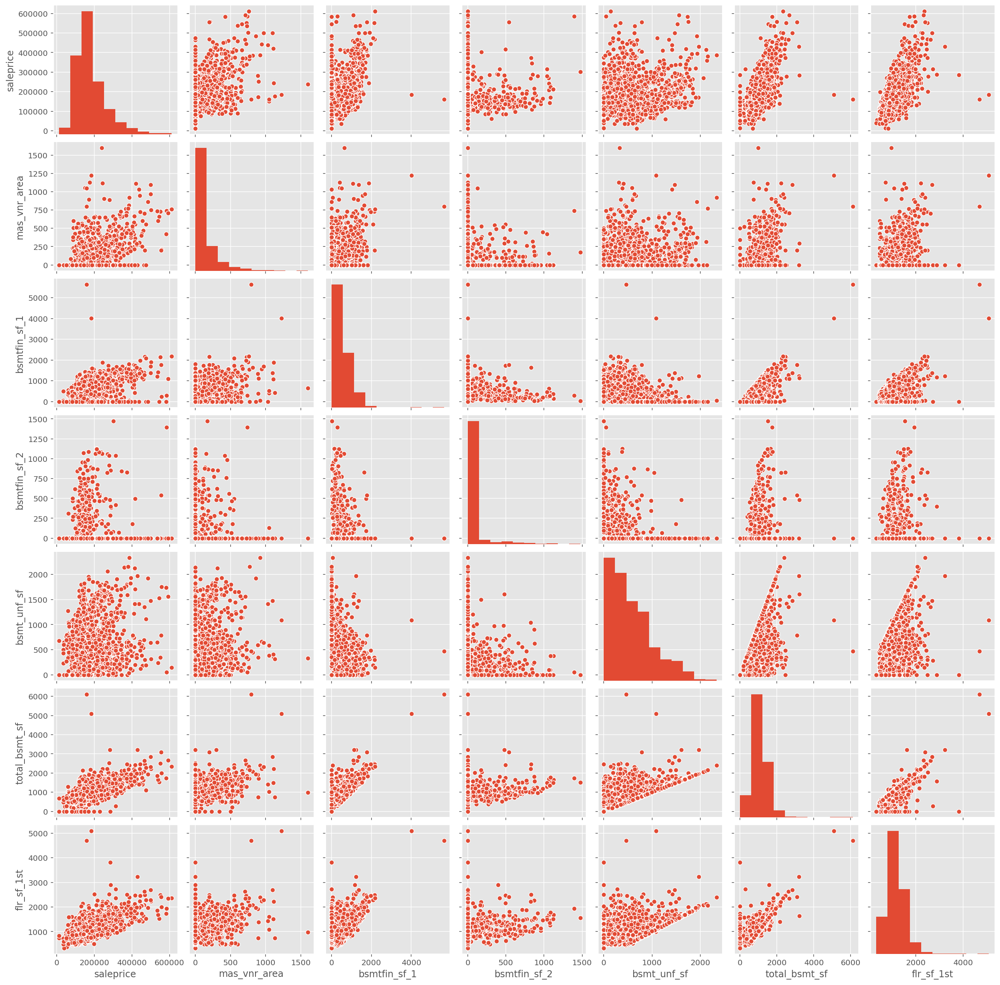

In [53]:
sns.pairplot(train[['saleprice','mas_vnr_area', 'bsmtfin_sf_1',
                    'bsmtfin_sf_2', 'bsmt_unf_sf', 'total_bsmt_sf', 'flr_sf_1st']]);

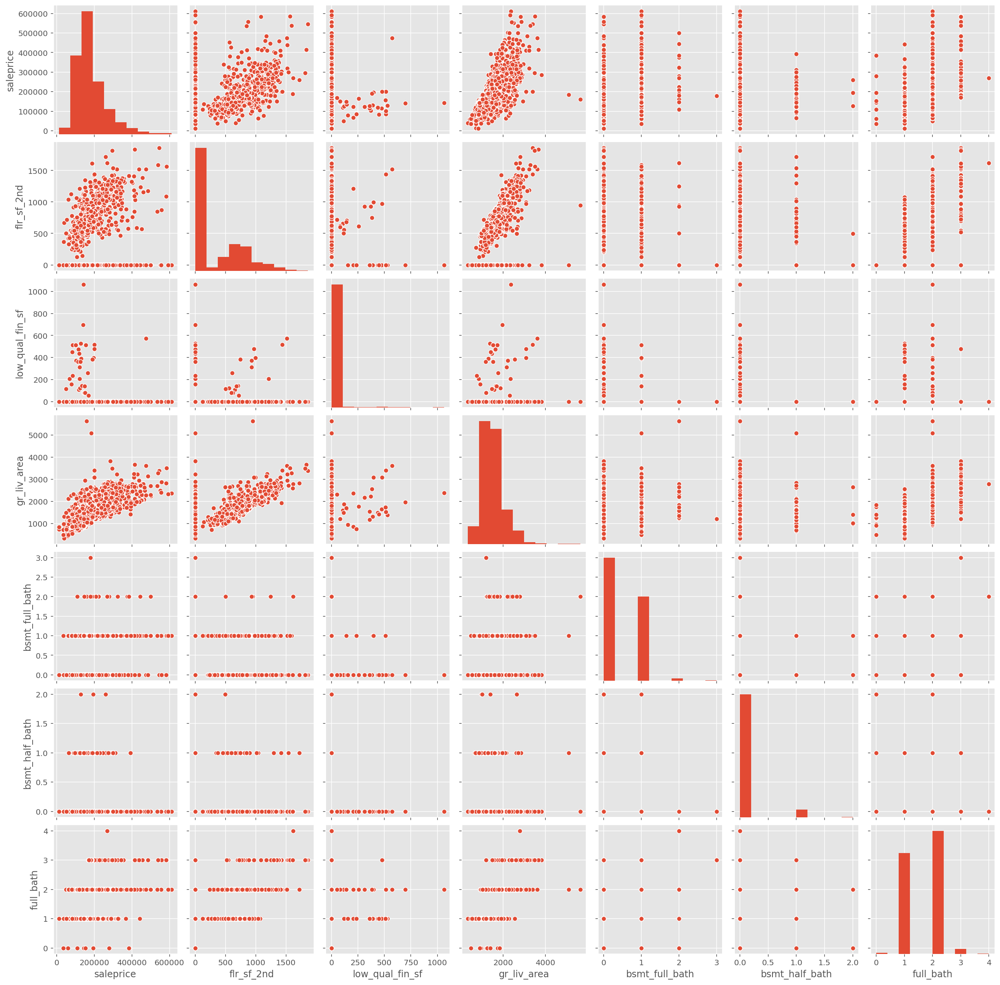

In [54]:
sns.pairplot(train[['saleprice','flr_sf_2nd', 'low_qual_fin_sf', 'gr_liv_area', 
                    'bsmt_full_bath','bsmt_half_bath', 'full_bath']]);

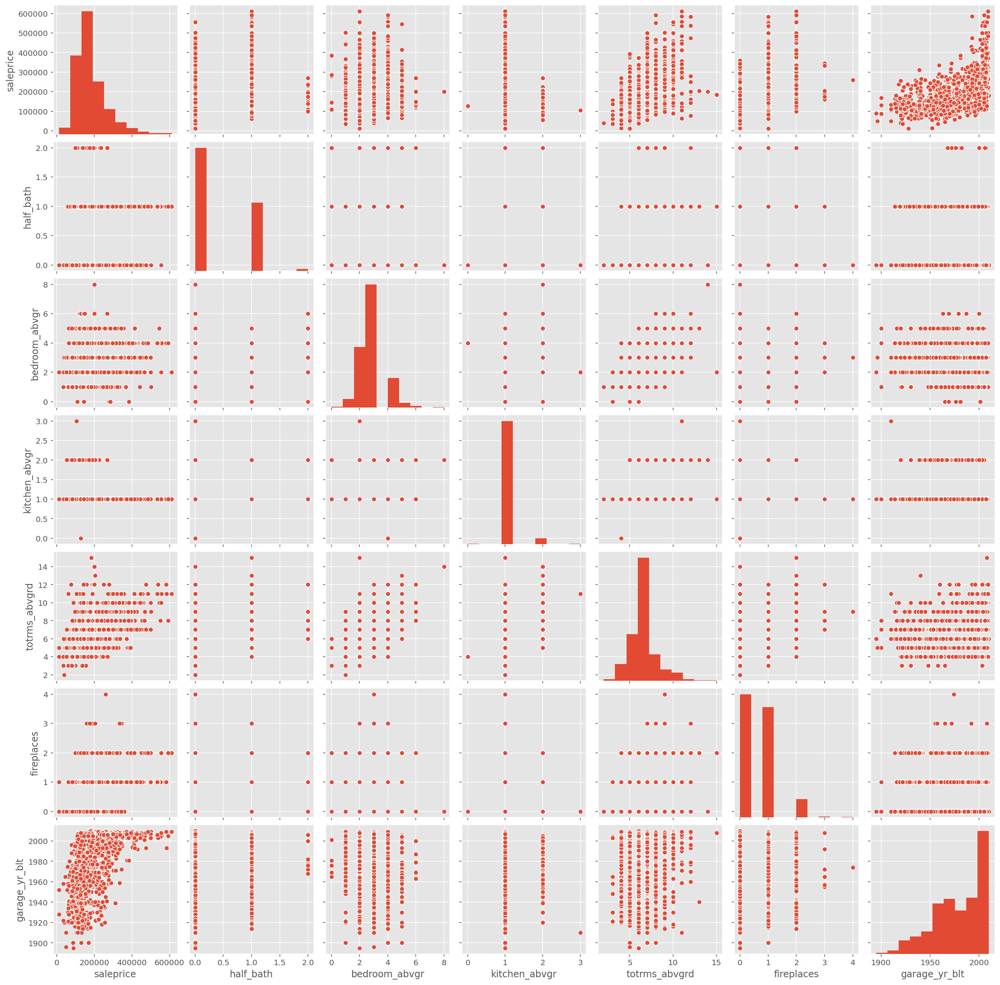

In [55]:
sns.pairplot(train[['saleprice', 'half_bath', 'bedroom_abvgr','kitchen_abvgr',
                    'totrms_abvgrd', 'fireplaces', 'garage_yr_blt']]);

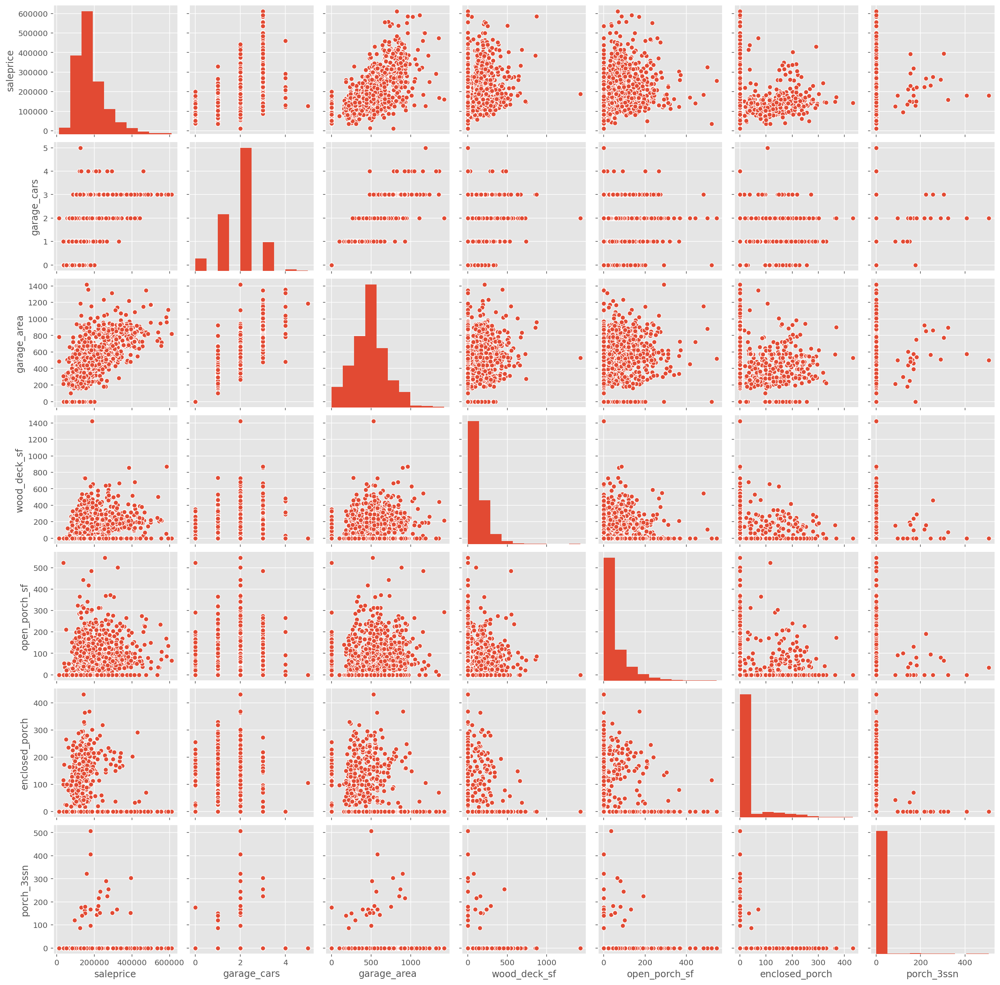

In [56]:
sns.pairplot(train[['saleprice','garage_cars', 'garage_area','wood_deck_sf', 
                    'open_porch_sf','enclosed_porch', 'porch_3ssn']]);

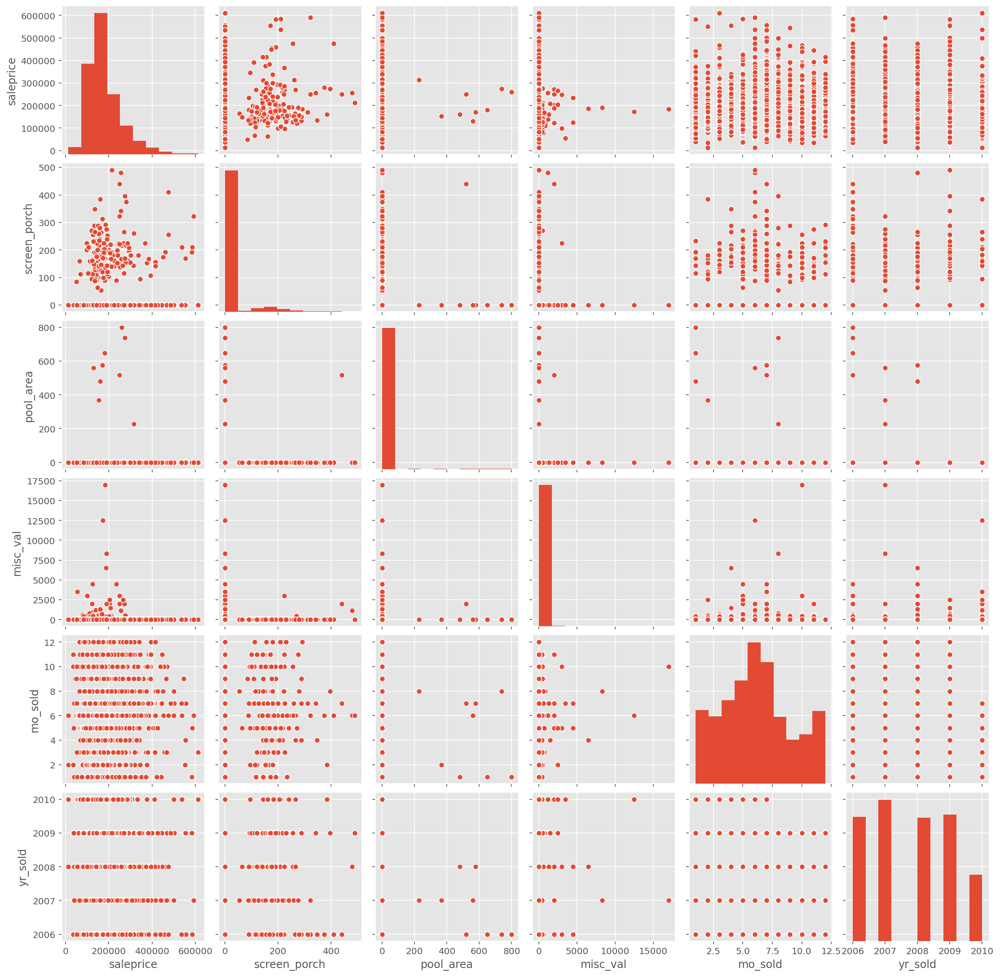

In [57]:
sns.pairplot(train[['saleprice', 'screen_porch', 'pool_area', 
         'misc_val', 'mo_sold', 'yr_sold']]);

<div class="alert alert-block alert-info">
<b>Scatter plots:</b> In using the pairplot to get a preview on the correlation, we now zoom in on the more interesting ones.
</div>

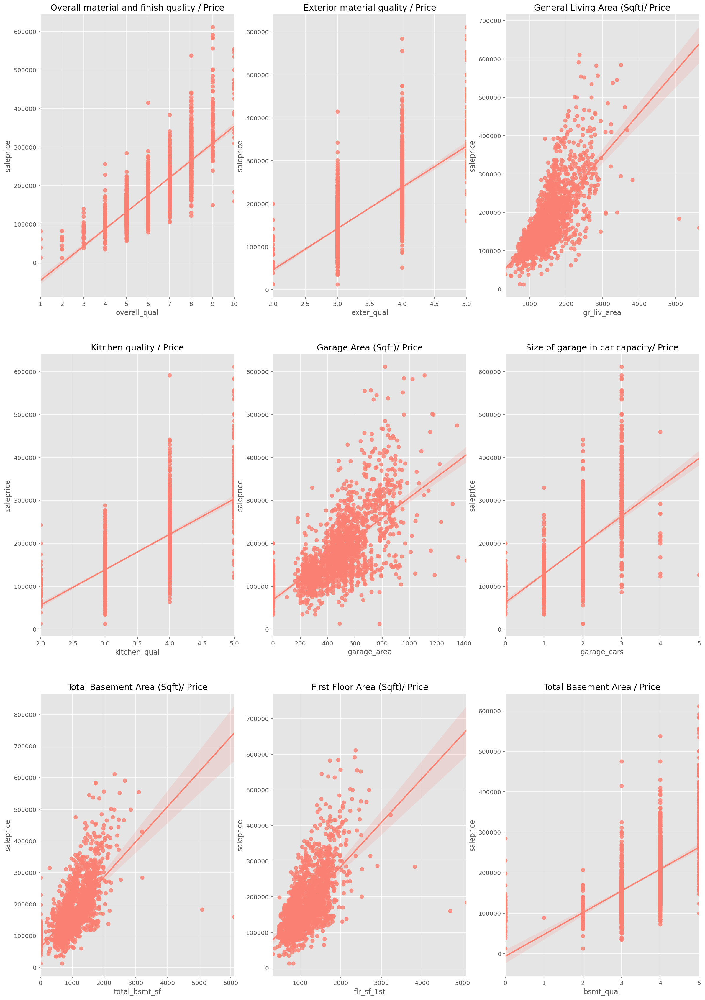

In [58]:
# set figure size
plt.figure(figsize=(20,30))

#plot regplot 1
plotreg(train, 'overall_qual', "saleprice", 331, "Overall material and finish quality / Price" )
plotreg(train, 'exter_qual', "saleprice", 332, "Exterior material quality / Price" )
plotreg(train, 'gr_liv_area', "saleprice", 333, "General Living Area (Sqft)/ Price" )
plotreg(train, 'kitchen_qual', "saleprice", 334, "Kitchen quality / Price" )
plotreg(train, 'garage_area', "saleprice", 335, "Garage Area (Sqft)/ Price" )
plotreg(train, 'garage_cars', "saleprice", 336, "Size of garage in car capacity/ Price" )
plotreg(train, 'total_bsmt_sf', "saleprice", 337, "Total Basement Area (Sqft)/ Price" )
plotreg(train, 'flr_sf_1st', "saleprice", 338, "First Floor Area (Sqft)/ Price" )
plotreg(train, 'bsmt_qual', "saleprice", 339, "Total Basement Area / Price" )





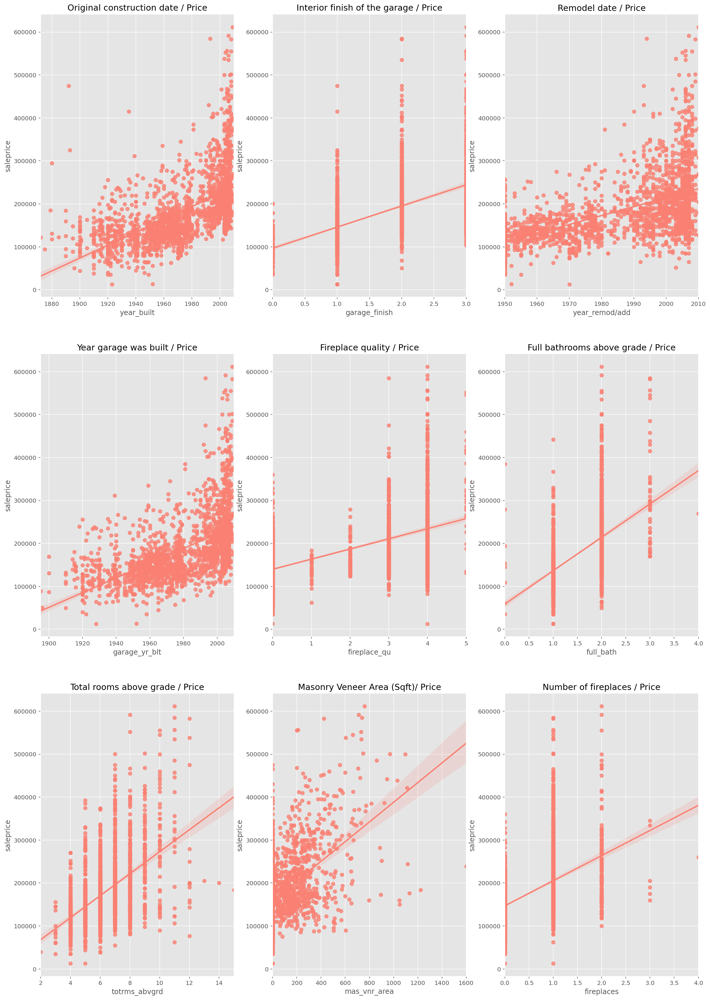

In [59]:
# set figure size
plt.figure(figsize=(20,30))

#plot regplot 2
plotreg(train, 'year_built', "saleprice", 331, "Original construction date / Price" )
plotreg(train, 'garage_finish', "saleprice", 332, "Interior finish of the garage / Price" )
plotreg(train, 'year_remod/add', "saleprice", 333, "Remodel date / Price" )
plotreg(train, 'garage_yr_blt', "saleprice", 334, "Year garage was built / Price" )
plotreg(train, 'fireplace_qu', "saleprice", 335, "Fireplace quality / Price" )
plotreg(train, 'full_bath', "saleprice", 336, "Full bathrooms above grade / Price" )
plotreg(train, 'totrms_abvgrd', "saleprice", 337, "Total rooms above grade / Price" )
plotreg(train, 'mas_vnr_area', "saleprice", 338, "Masonry Veneer Area (Sqft)/ Price" )
plotreg(train, 'fireplaces', "saleprice", 339, "Number of fireplaces / Price" )

<div class="alert alert-block alert-info">
<b>Scatter (Years):</b> we see a very interesting clustering very different from the other plots coming from year based plots. It shows the cluster moving higher as it moves closer to the right. confirming a time based pattern of distribution.  
</div>

***

In [ ]:
# export clean dataframe as csv 
train.to_csv("../datasets/train_clean_EDA.csv")

A few category of features are starting to stand out. 
As preprocessing will next, using this information i will go on to target these features and alter, add or delete more features for the model. 

Continue to: [03_Preprocessing_and_Modeling](03_Preprocessing_and_Modeling.ipynb)

Or proceed back to:
- [01_Cleaning_for_Train_and_Test_Sets](01_Cleaning_for_Train_and_Test_Sets.ipynb)